flight paths

In [18]:
import folium
import pandas as pd

#add path to file
file_path = '/Users/annaschneider/Desktop/relavent_files_raftparser/SFO_IAD_20230203_clean.csv'
df = pd.read_csv(file_path)

#change the zoom_start to desire start zoom
m = folium.Map(location=[37.6, -122.3], zoom_start=4)

def add_flight_path(df, flight_key):
    flight_data = df[df['fltKey'] == flight_key]
    coordinates = flight_data[['Latitude', 'Longitude']].values.tolist()
    folium.PolyLine(locations=coordinates, color='blue', weight=2.5, opacity=1).add_to(m)
    for coord in coordinates:
        folium.CircleMarker(location=coord, radius=2, color='red', fill=True).add_to(m)

flight_keys = df['fltKey'].unique()
for key in flight_keys:
    add_flight_path(df, key)
m

heatmap

In [10]:
import folium
from folium.plugins import HeatMap
import pandas as pd

#add path to file
file_path = '/Users/annaschneider/Desktop/relavent_files_raftparser/SFO_IAD_20230201_20230208.csv'
df = pd.read_csv(file_path)

#change the start zoom if needed
m = folium.Map(location=[37.6, -122.3], zoom_start= 4)
heat_data = df[['Latitude', 'Longitude']].values.tolist()

#comment out this line or the section below
HeatMap(heat_data).add_to(m)

#HeatMap(
    #heat_data,
    #radius=20,         # Change the radius to 20 pixels
    #blur=10,           # Change the blur to 10 pixels
    #min_opacity=0.2,   # Change the minimum opacity to 0.2
    #max_val=1.0,       # Set the maximum value for the data points
    #gradient={0.4: 'blue', 0.65: 'lime', 1: 'red'}  # Custom gradient
#).add_to(m)

m

next point flight path prediction

0 2431
2431 4930
4930 7104


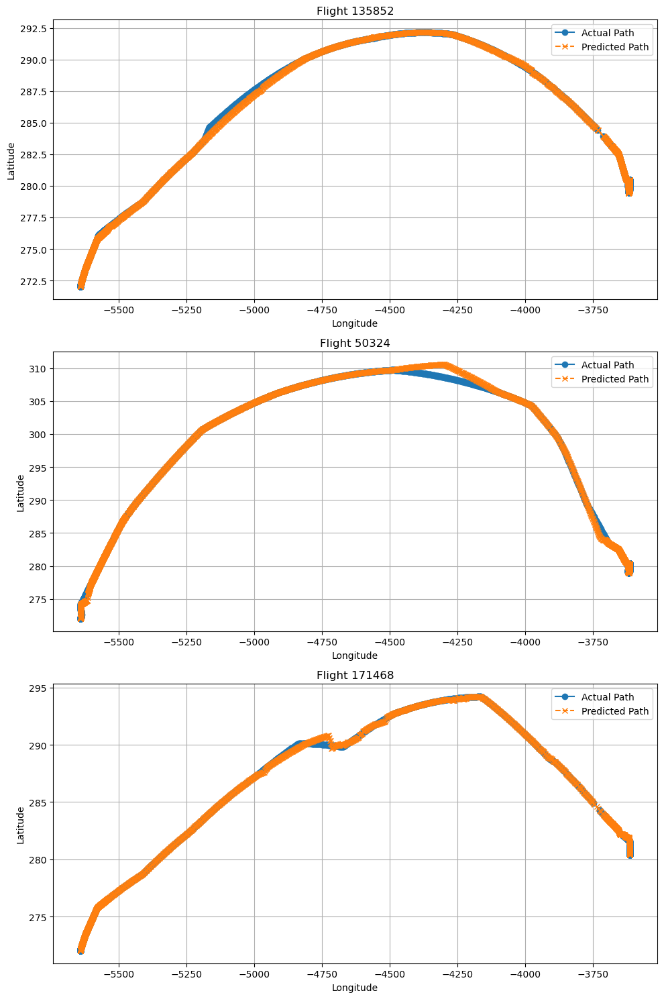

In [16]:
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

#add path to file
file_path = '/Users/annaschneider/Desktop/relavent_files_raftparser/SFO_IAD_20230201_20230208.csv'
data = pd.read_csv(file_path)

flight_keys = data['fltKey'].unique() #change test size if wanted
train_keys, test_keys = train_test_split(flight_keys, test_size=0.2, random_state=42)

train_data = data[data['fltKey'].isin(train_keys)]
test_data = data[data['fltKey'].isin(test_keys)]
len(train_keys), len(test_keys)

scaler = MinMaxScaler()
data[['Latitude', 'Longitude']] = scaler.fit_transform(data[['Latitude', 'Longitude']])

#sequence_length controls number of points used to predict next point
def create_knn_sequences(data, seq_length=30):
    sequences = []
    targets = []
    for fltKey in data['fltKey'].unique():
        flight_data = data[data['fltKey'] == fltKey]
        coords = flight_data[['Latitude', 'Longitude']].values
        if len(coords) > seq_length:
            for i in range(len(coords) - seq_length):
                sequences.append(coords[i:i+seq_length])
                targets.append(coords[i+seq_length])
    return np.array(sequences), np.array(targets)

X_train_knn, y_train_knn = create_knn_sequences(train_data)

knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_knn.reshape(X_train_knn.shape[0], -1), y_train_knn)

X_test_knn, y_test_knn = create_knn_sequences(test_data)
y_pred_knn = knn_model.predict(X_test_knn.reshape(X_test_knn.shape[0], -1))

mse = mean_squared_error(y_test_knn, y_pred_knn)
mse

# num_flights is the number of flights printed
def plot_paths(test_data, y_pred_knn, scaler, num_flights=3):
    fig, axes = plt.subplots(num_flights, 1, figsize=(10, 5 * num_flights))
    
    test_flights = test_data['fltKey'].unique()[:num_flights]
    start_index = 0
    for i, fltKey in enumerate(test_flights):
        flight_data = test_data[test_data['fltKey'] == fltKey]
        actual_coords = flight_data[['Latitude', 'Longitude']].values

        end_index = start_index + len(actual_coords) -30
        predicted_coords = y_pred_knn[start_index:end_index]
        print(start_index, end_index)
        start_index = end_index 
        
        actual_coords_rescaled = scaler.inverse_transform(actual_coords)
        predicted_coords_rescaled = scaler.inverse_transform(predicted_coords)
        
        axes[i].plot(actual_coords_rescaled[:, 1], actual_coords_rescaled[:, 0], label='Actual Path', marker='o')
        axes[i].plot(predicted_coords_rescaled[:, 1], predicted_coords_rescaled[:, 0], label='Predicted Path', linestyle='--', marker='x')
        axes[i].set_title(f'Flight {fltKey}')
        axes[i].set_xlabel('Longitude')
        axes[i].set_ylabel('Latitude')
        axes[i].legend()
        axes[i].grid(True)
    
    plt.tight_layout()
    plt.show()

plot_paths(test_data, y_pred_knn, scaler)

In [ ]:
rest of path flight prediction

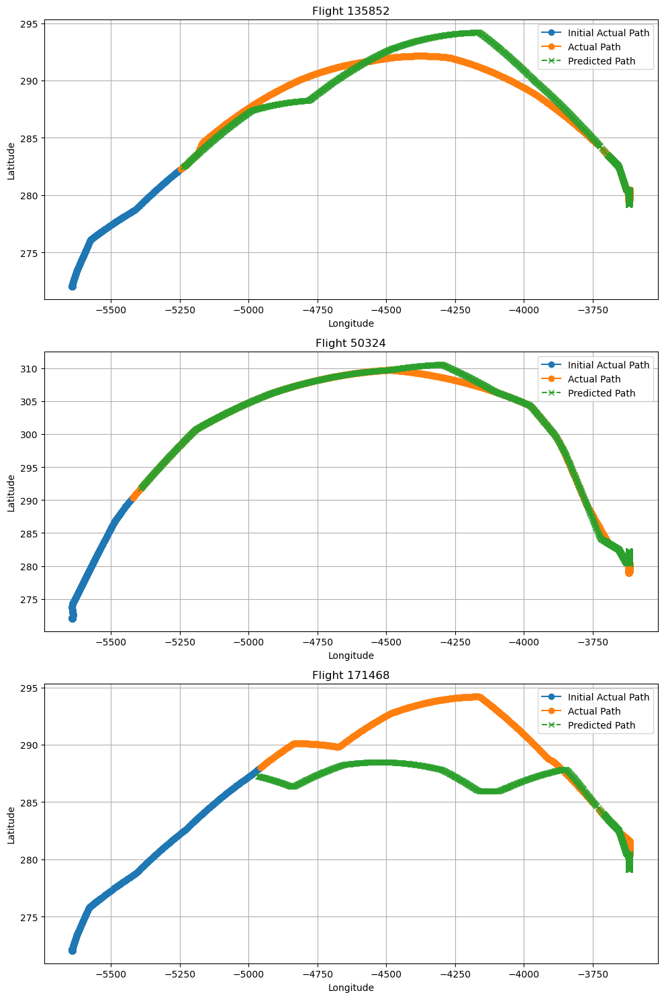

In [15]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Add path to file
file_path = '/Users/annaschneider/Desktop/clean_files/SFO_IAD_20230201_20230208.csv'
data = pd.read_csv(file_path)

flight_keys = data['fltKey'].unique()  # Change test size if wanted
train_keys, test_keys = train_test_split(flight_keys, test_size=0.2, random_state=42)

train_data = data[data['fltKey'].isin(train_keys)]
test_data = data[data['fltKey'].isin(test_keys)]
len(train_keys), len(test_keys)

scaler = MinMaxScaler()
data[['Latitude', 'Longitude']] = scaler.fit_transform(data[['Latitude', 'Longitude']])

# Sequence length controls number of points used to predict the next point
seq_length = 1000

def create_knn_sequences(data, seq_length):
    sequences = []
    targets = []
    for fltKey in data['fltKey'].unique():
        flight_data = data[data['fltKey'] == fltKey]
        coords = flight_data[['Latitude', 'Longitude']].values
        if len(coords) > seq_length:
            for i in range(len(coords) - seq_length):
                sequences.append(coords[i:i+seq_length])
                targets.append(coords[i+seq_length])
    return np.array(sequences), np.array(targets)

X_train_knn, y_train_knn = create_knn_sequences(train_data, seq_length)

knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_knn.reshape(X_train_knn.shape[0], -1), y_train_knn)

# num_flights is the number of flights printed
def plot_paths(test_data, knn_model, scaler, num_flights=3, seq_length=1000):
    fig, axes = plt.subplots(num_flights, 1, figsize=(10, 5 * num_flights))
    
    test_flights = test_data['fltKey'].unique()[:num_flights]
    for i, fltKey in enumerate(test_flights):
        flight_data = test_data[test_data['fltKey'] == fltKey]
        actual_coords = flight_data[['Latitude', 'Longitude']].values
        initial_coords = actual_coords[:seq_length]

        # Predict subsequent points based on the initial 400 coordinates
        predicted_coords = []
        current_sequence = initial_coords.copy()
        
        for j in range(seq_length, len(actual_coords)):
            pred = knn_model.predict(current_sequence.reshape(1, -1))
            predicted_coords.append(pred[0])
            current_sequence = np.vstack([current_sequence[1:], pred])
        
        actual_coords_rescaled = scaler.inverse_transform(actual_coords)
        initial_coords_rescaled = actual_coords_rescaled[:seq_length]
        predicted_coords_rescaled = scaler.inverse_transform(predicted_coords)
        
        axes[i].plot(initial_coords_rescaled[:, 1], initial_coords_rescaled[:, 0], label='Initial Actual Path', marker='o')
        axes[i].plot(actual_coords_rescaled[seq_length:, 1], actual_coords_rescaled[seq_length:, 0], label='Actual Path', marker='o')
        axes[i].plot(predicted_coords_rescaled[:, 1], predicted_coords_rescaled[:, 0], label='Predicted Path', linestyle='--', marker='x')
        axes[i].set_title(f'Flight {fltKey}')
        axes[i].set_xlabel('Longitude')
        axes[i].set_ylabel('Latitude')
        axes[i].legend()
        axes[i].grid(True)
    
    plt.tight_layout()
    plt.show()

plot_paths(test_data, knn_model, scaler, num_flights=3, seq_length=1000)


In [19]:
import folium
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler

# Load data and preprocess as before
file_path = '/Users/annaschneider/Desktop/clean_files/SFO_IAD_20230201_20230208.csv'
data = pd.read_csv(file_path)

flight_keys = data['fltKey'].unique()
train_keys, test_keys = train_test_split(flight_keys, test_size=0.2, random_state=42)

train_data = data[data['fltKey'].isin(train_keys)]
test_data = data[data['fltKey'].isin(test_keys)]
len(train_keys), len(test_keys)

scaler = MinMaxScaler()
data[['Latitude', 'Longitude']] = scaler.fit_transform(data[['Latitude', 'Longitude']])

seq_length = 1000

def create_knn_sequences(data, seq_length):
    sequences = []
    targets = []
    for fltKey in data['fltKey'].unique():
        flight_data = data[data['fltKey'] == fltKey]
        coords = flight_data[['Latitude', 'Longitude']].values
        if len(coords) > seq_length:
            for i in range(len(coords) - seq_length):
                sequences.append(coords[i:i+seq_length])
                targets.append(coords[i+seq_length])
    return np.array(sequences), np.array(targets)

X_train_knn, y_train_knn = create_knn_sequences(train_data, seq_length)

knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_knn.reshape(X_train_knn.shape[0], -1), y_train_knn)

def plot_paths_folium(test_data, knn_model, scaler, num_flights=1, seq_length=1000):
    test_flights = test_data['fltKey'].unique()[:num_flights]
    
    # Initialize a base folium map
    center_lat = test_data['Latitude'].mean()
    center_lon = test_data['Longitude'].mean()
    m = folium.Map(location=[center_lat, center_lon], zoom_start=6)
    
    for fltKey in test_flights:
        flight_data = test_data[test_data['fltKey'] == fltKey]
        actual_coords = flight_data[['Latitude', 'Longitude']].values
        initial_coords = actual_coords[:seq_length]

        # Predict subsequent points based on the initial 400 coordinates
        predicted_coords = []
        current_sequence = initial_coords.copy()
        
        for j in range(seq_length, len(actual_coords)):
            pred = knn_model.predict(current_sequence.reshape(1, -1))
            predicted_coords.append(pred[0])
            current_sequence = np.vstack([current_sequence[1:], pred])
        
        actual_coords_rescaled = scaler.inverse_transform(actual_coords)
        initial_coords_rescaled = actual_coords_rescaled[:seq_length]
        predicted_coords_rescaled = scaler.inverse_transform(predicted_coords)
        
        # Add paths to the folium map
        folium.PolyLine(
            locations=[(lat, lon) for lat, lon in zip(initial_coords_rescaled[:, 0], initial_coords_rescaled[:, 1])],
            color='blue', weight=5, opacity=0.6, tooltip=f'Initial Path for Flight {fltKey}'
        ).add_to(m)

        folium.PolyLine(
            locations=[(lat, lon) for lat, lon in zip(actual_coords_rescaled[seq_length:, 0], actual_coords_rescaled[seq_length:, 1])],
            color='orange', weight=5, opacity=0.6, tooltip=f'Actual Path for Flight {fltKey}'
        ).add_to(m)

        folium.PolyLine(
            locations=[(lat, lon) for lat, lon in zip(predicted_coords_rescaled[:, 0], predicted_coords_rescaled[:, 1])],
            color='green', weight=5, opacity=0.6, dash_array='5,10', tooltip=f'Predicted Path for Flight {fltKey}'
        ).add_to(m)

    # Save map to an HTML file or display in notebook
    m.save('flight_paths_folium.html')
    return m

# Call the function to plot the paths using folium
m = plot_paths_folium(test_data, knn_model, scaler, num_flights=1, seq_length=1000)

# If using a Jupyter notebook, display the map
m
